Loading Necessary Libraries

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.ml.feature import StringIndexer
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.tuning import TrainValidationSplit
from pyspark.ml.evaluation import RegressionEvaluator

import mlflow
from pyspark.ml.recommendation import ALS

mlflow.pyspark.ml.autolog()

Loading DataSets

In [0]:
#check for file in file path
dbutils.fs.ls('FileStore/tables/steam_200k.csv')

[FileInfo(path='dbfs:/FileStore/tables/steam_200k.csv', name='steam_200k.csv', size=8059447, modificationTime=1712987250000)]

In [0]:
#create schema and store the dataframe to an object
schema = StructType([
    StructField('Member_Id', IntegerType()),
    StructField('NameOfGames', StringType()),
    StructField('Behaviour', StringType()),
    StructField('Hours_Played', DoubleType())
])

steam = spark.read.csv('/FileStore/tables/steam_200k.csv', schema=schema, header=False)

In [0]:
#show the dataframe loaded to steam object
steam.display()

Member_Id,NameOfGames,Behaviour,Hours_Played
151603712,The Elder Scrolls V Skyrim,purchase,1.0
151603712,The Elder Scrolls V Skyrim,play,273.0
151603712,Fallout 4,purchase,1.0
151603712,Fallout 4,play,87.0
151603712,Spore,purchase,1.0
151603712,Spore,play,14.9
151603712,Fallout New Vegas,purchase,1.0
151603712,Fallout New Vegas,play,12.1
151603712,Left 4 Dead 2,purchase,1.0
151603712,Left 4 Dead 2,play,8.9


In [0]:
gamesSchema = StructType([
    StructField('GameId', IntegerType()),
    StructField('GameName', StringType())
])
games = spark.read.csv('dbfs:/FileStore/tables/games.csv', 
                       header=False,
                       schema= gamesSchema)
games.display()

GameId,GameName
1,The Elder Scrolls V Skyrim
2,Fallout 4
3,Spore
4,Fallout New Vegas
5,Left 4 Dead 2
6,HuniePop
7,Path of Exile
8,Poly Bridge
9,Left 4 Dead
10,Team Fortress 2


Exploratory Analysis

In [0]:
#total sample count of files given
steam_count= steam.count()
print(f'Totals Lenght of Steam File {steam_count}')

Totals Lenght of Steam File 200000


In [0]:
#distinct total number of games available on Steam
distinct_games_count= steam.select('NameOfGames').distinct().count()
print(f'The Total Number of Games Played on Steam file: {distinct_games_count}')

The Total Number of Games Played on Steam file: 5155


In [0]:
#validation of game counts present
games_count= games.count()
print(games_count)

5155


In [0]:
#check for null values
missing_values = steam.select([count(when(isnull(c), c)).alias(c) for c in steam.columns])
missing_values.display()

Member_Id,NameOfGames,Behaviour,Hours_Played
0,0,0,0


In [0]:
#check for dubplicates present in the dataset
duplicates= steam.groupBy(steam.columns).count().filter(col("count") > 1)
duplicates.display()
steam= steam.dropDuplicates()

Member_Id,NameOfGames,Behaviour,Hours_Played,count
9823354,Sid Meier's Civilization IV Warlords,purchase,1.0,2
2259650,Sid Meier's Civilization IV Colonization,purchase,1.0,2
56038151,Grand Theft Auto San Andreas,purchase,1.0,2
142001340,Grand Theft Auto San Andreas,purchase,1.0,2
152959594,Grand Theft Auto III,purchase,1.0,2
50769696,Grand Theft Auto San Andreas,purchase,1.0,2
11813637,Sid Meier's Civilization IV Warlords,purchase,1.0,2
65398650,Sid Meier's Civilization IV Colonization,purchase,1.0,2
36502549,Sid Meier's Civilization IV Colonization,purchase,1.0,2
80779496,Sid Meier's Civilization IV Beyond the Sword,purchase,1.0,2


In [0]:
#count to show that all duplicates are dropped.
steam.count()

199293

Behaviour,count,Percentage
purchase,128804,64.63
play,70489,35.37


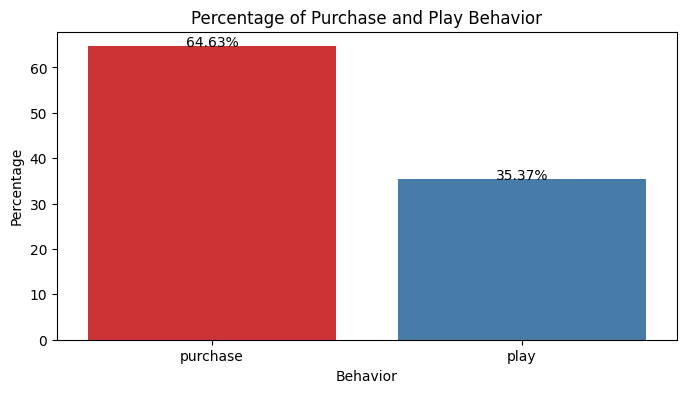

In [0]:
#percentage of game purchases to played games
total_records = steam.count()
purchase_play_percentage = steam.groupBy("Behaviour") \
    .count() \
    .withColumn("Percentage", round((col("count") / lit(total_records)) * 100, 2))

purchase_play_percentage.display()

purchase_play_percentage_pd = purchase_play_percentage.toPandas()
plt.figure(figsize=(8, 4))
sns.barplot(x='Behaviour', y='Percentage', data=purchase_play_percentage_pd, palette='Set1')

for index, row in purchase_play_percentage_pd.iterrows():
    plt.text(row.name, row.Percentage, f'{row.Percentage}%', color='black', ha="center")

# Set plot title and labels
plt.title('Percentage of Purchase and Play Behavior')
plt.xlabel('Behavior')
plt.ylabel('Percentage')

# Show plot
plt.show()

NameOfGames,count
Dota 2,4841
Team Fortress 2,2323
Unturned,1563
Counter-Strike Global Offensive,1412
Half-Life 2 Lost Coast,981
Counter-Strike Source,978


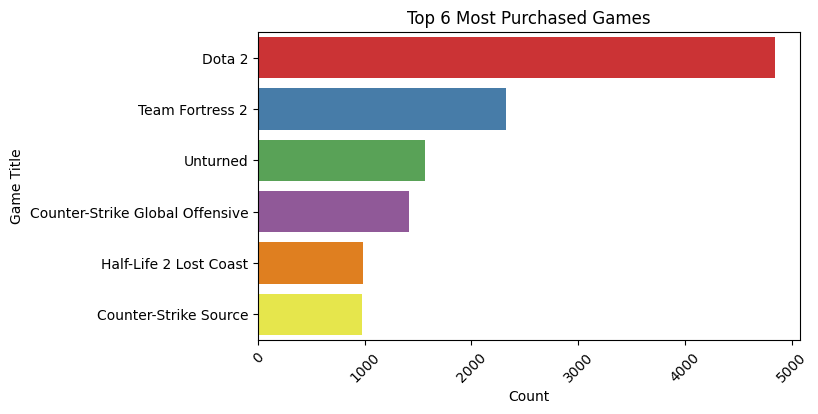

In [0]:
#Most Purchased Steam games by users
purchase_games = steam.filter(col('Behaviour') == 'purchase')
top_purchase_games = purchase_games.groupBy('NameOfGames').count()
top_purchase_games = top_purchase_games.orderBy('count', ascending=False).limit(6)
top_purchase_games.display()


# Convert to Pandas DataFrame
top_purchase_games = top_purchase_games.toPandas()

# Plot the countplot using Seaborn
plt.figure(figsize=(7, 4))
sns.barplot(x='count', y='NameOfGames', data=top_purchase_games, palette='Set1')
plt.xlabel('Count')
plt.ylabel('Game Title')
plt.title('Top 6 Most Purchased Games')
plt.xticks(rotation=45)
plt.show()

NameOfGames,sum(Hours_Played)
Dota 2,981684.6000000001
Counter-Strike Global Offensive,322771.60000000015
Team Fortress 2,173673.3
Counter-Strike,134261.09999999992
Sid Meier's Civilization V,99821.29999999999


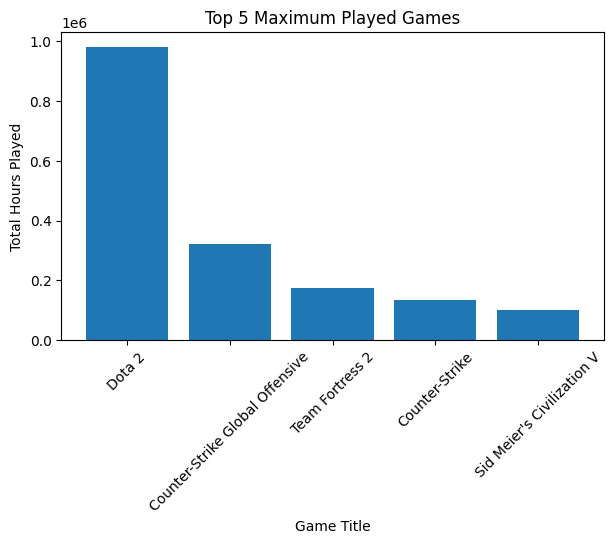

In [0]:
# Top 5 Maximum Played Games
top_played_games = steam.filter(steam['Behaviour'] == 'play') \
                            .groupBy('NameOfGames') \
                            .sum('Hours_Played') \
                            .orderBy('sum(Hours_Played)', ascending=False) \
                            .limit(5)
 
top_played_games.display()
top_played_games_pandas = top_played_games.toPandas()
 
plt.figure(figsize=(7, 4))
plt.bar(top_played_games_pandas['NameOfGames'], top_played_games_pandas['sum(Hours_Played)'])
plt.xlabel('Game Title')
plt.ylabel('Total Hours Played')
plt.title('Top 5 Maximum Played Games')
plt.xticks(rotation=45)
plt.show()

In [0]:
#using Sql for further information
steam_hours = steam.filter(col('Behaviour')== 'play')
steam_hours.createOrReplaceTempView('Steam')

In [0]:
%sql

-- "Highest Gaming Hours and The Most Played Game By An Individual"
SELECT * 
FROM steam
WHERE Member_Id IN (
    SELECT Member_Id
    FROM (
        SELECT Member_Id, SUM(Hours_Played) AS sum
        FROM steam 
        GROUP BY Member_Id
        ORDER BY sum DESC
        LIMIT 5
    )
)
ORDER BY Hours_played DESC

Member_Id,NameOfGames,Behaviour,Hours_Played
73017395,Sid Meier's Civilization V,play,11754.0
100630947,Dota 2,play,10442.0
153382649,Team Fortress 2,play,9640.0
26762388,The Elder Scrolls V Skyrim,play,1090.0
10599862,Total War ROME II - Emperor Edition,play,1061.0
10599862,Mount & Blade Warband,play,880.0
26762388,Mount & Blade Warband,play,825.0
10599862,Path of Exile,play,785.0
10599862,Elite Dangerous,play,746.0
10599862,Crusader Kings II,play,672.0


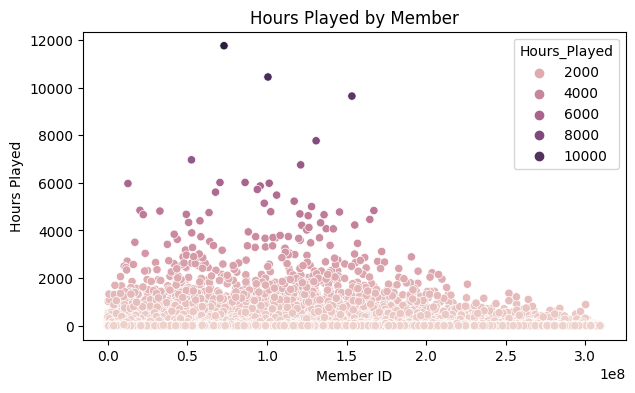

In [0]:
# Plot the scatter plot with custom palette
plt.figure(figsize=(7, 4))
sns.scatterplot(x='Member_Id', y='Hours_Played', data=steam.toPandas(), hue= 'Hours_Played',)

# Set plot title and labels
plt.title('Hours Played by Member')
plt.xlabel('Member ID')
plt.ylabel('Hours Played')

# Show plot
plt.show()

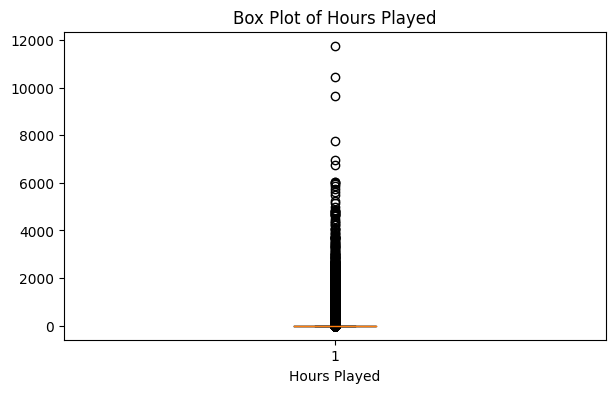

In [0]:
#check for outliers on the hours played samples provided
plt.figure(figsize=(7, 4))
plt.boxplot(data=steam.toPandas(), x='Hours_Played')

plt.xlabel('Hours Played')
plt.title('Box Plot of Hours Played')

plt.show()

Generation of Unique/Distinct Steam Game Identifiers

In [0]:
#create Unique Id for all Games
indexer = StringIndexer(inputCol='NameOfGames', outputCol='Game_Id', stringOrderType='frequencyDesc')

# Fit and transform the data
steam2 = indexer.fit(steam).transform(steam)
steam2 = steam2.withColumn('Game_Id', steam2['Game_Id'] + 1)

2024/05/02 05:27:51 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '6e25623bac1e427b8b8e3da4acaf91f8', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow


In [0]:
generated_game_identifier= steam2.select('Game_Id', 'NameOfGames').dropDuplicates().orderBy('Game_Id', reverse= False)
generated_game_identifier.display()

Game_Id,NameOfGames
1.0,Dota 2
2.0,Team Fortress 2
3.0,Counter-Strike Global Offensive
4.0,Unturned
5.0,Left 4 Dead 2
6.0,Counter-Strike Source
7.0,Counter-Strike
8.0,Garry's Mod
9.0,The Elder Scrolls V Skyrim
10.0,Warframe


Seperation of Played & Purchase Games And Droping Unwanted training columns

In [0]:
#Seperate Purchased and Played Games
purchaseGames = steam2.filter(col('Behaviour')== 'purchase')
playedGames = steam2.filter(col('Behaviour') == 'play')

In [0]:
#drop unwanted columns for filtered played and purchased games  
purchaseGames = purchaseGames.drop('NameOfGames', 'Behaviour', 'GameName')
playedGames = playedGames.drop('NameOfGames', 'Behaviour', 'GameName')

#show results form dropped columns
playedGames.display()
purchaseGames.display()  

Member_Id,Hours_Played,Game_Id
53875128,9.8,731.0
53875128,0.1,604.0
65117175,3.3,97.0
11373749,7.0,1926.0
11373749,2.3,148.0
56038151,2.8,112.0
100519466,1.6,21.0
16167221,722.0,20.0
210669058,1.4,1.0
229467150,24.0,1.0


Member_Id,Hours_Played,Game_Id
53875128,1.0,602.0
53875128,1.0,4082.0
126340495,1.0,81.0
97298878,1.0,560.0
226212066,1.0,1452.0
65117175,1.0,750.0
11373749,1.0,1.0
11373749,1.0,6.0
171847029,1.0,203.0
56038151,1.0,106.0


Treating Outliers

In [0]:
quantiles = playedGames.approxQuantile('Hours_Played', [0.25, 0.75], 0.05)
 
# Calculate IQR
q1 = quantiles[0]
q3 = quantiles[1]
iqr = q3 - q1
 
# Define lower and upper bounds for outlier detection
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
 
# Filter out rows outside the lower and upper bounds
playedGames = playedGames.filter((col('Hours_Played') >= lower_bound) & (col('Hours_Played') <= upper_bound))
playedGames.show()

+---------+------------+-------+
|Member_Id|Hours_Played|Game_Id|
+---------+------------+-------+
| 53875128|         9.8|  731.0|
| 53875128|         0.1|  604.0|
| 65117175|         3.3|   97.0|
| 11373749|         7.0| 1926.0|
| 11373749|         2.3|  148.0|
| 56038151|         2.8|  112.0|
|100519466|         1.6|   21.0|
|210669058|         1.4|    1.0|
|229467150|        24.0|    1.0|
|111316830|         6.0| 3220.0|
| 72842694|         1.7|  971.0|
| 65229865|        22.0| 1342.0|
| 65958466|         7.1|  454.0|
| 68224834|         4.8|    9.0|
| 34177747|         0.3|  562.0|
|196223620|        23.0|   94.0|
|149438233|         0.2|    2.0|
|118894547|         0.6|  274.0|
| 87071236|         1.7|  372.0|
|182399789|         0.2|  191.0|
+---------+------------+-------+
only showing top 20 rows



Training Recommendation Model

In [0]:
#split Data
(training, test) = playedGames.randomSplit([0.8, 0.2], seed=100)

In [0]:
#Train Model
als = ALS(maxIter= 9, regParam=0.03, userCol='Member_Id', itemCol='Game_Id', ratingCol='Hours_Played')
model= als.fit(training)

2024/05/02 05:28:06 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '5ed6cf24fac4466891aefe6166c00c01', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/05/02 05:28:07 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.11/site-packages/mlflow/types/utils.py:393: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Valu

In [0]:
#make prediction on test Dataset
predictions = model.transform(test).dropna()
predictions.display()

Member_Id,Hours_Played,Game_Id,prediction
86540,0.7,23,2.0300922
298950,0.1,514,3.1099653
298950,0.3,2049,0.5177832
298950,0.9,270,0.6938695
298950,3.5,200,3.88888
554278,4.5,108,4.486205
561758,4.7,567,8.122011
561758,5.6,462,2.189104
561758,7.2,175,6.9349546
561758,8.2,50,9.894501


In [0]:
#Evaluate the predictions
evaluator = RegressionEvaluator(metricName="rmse", labelCol="Hours_Played", predictionCol="prediction")

rmse = evaluator.evaluate(predictions)

print("Root Mean Square Error is", rmse)

Root Mean Square Error is 6.112332825199009


In [0]:
%sql

-- having users who dont have much purchases but have potentials of making more purchase based on the time spent playing games

select Member_Id, count(Member_Id) count, sum(Hours_Played) SumOfHoursPlayed
from steam
group by Member_Id
having (count between 7 and 15) and (SumOfHoursPlayed > 4000)
order by count asc

Member_Id,count,SumOfHoursPlayed
121900241,7,5038.799999999999
42935819,7,8172.9
78799565,8,5186.9
137222368,9,4246.8
20207081,9,5316.4
42849279,9,6766.2
64392327,10,5301.0
49380630,11,5525.9
57905818,13,5534.8
40080833,13,4057.9


In [0]:
#make Recommendation for all users, suggesting suitable games that they might like.
userRec = model.recommendForAllUsers(10)

In [0]:
#show the recommendations for users.
userRec.display()

Member_Id,recommendations
76767,"List(List(2272, 118.6334), List(1618, 83.1678), List(739, 64.14769), List(493, 62.81851), List(726, 60.741554), List(1563, 59.768856), List(812, 57.65791), List(226, 54.522346), List(290, 54.118225), List(100, 53.30114))"
144736,"List(List(926, 0.29605633), List(751, 0.27900127), List(81, 0.26534685), List(596, 0.2519531), List(527, 0.24347067), List(2899, 0.24292195), List(899, 0.24277148), List(1301, 0.23580769), List(1125, 0.23560421), List(631, 0.22274992))"
229911,"List(List(273, 31.433361), List(623, 29.473024), List(2272, 28.263777), List(309, 28.087952), List(1129, 26.558413), List(806, 24.914093), List(1160, 23.813473), List(1176, 23.679272), List(568, 23.27762), List(290, 22.78416))"
975449,"List(List(576, 38.310036), List(327, 37.62082), List(873, 34.242786), List(583, 31.66849), List(493, 30.261599), List(1041, 29.533195), List(4471, 28.654959), List(1743, 28.506025), List(566, 27.402575), List(726, 27.322212))"
1268792,"List(List(926, 1.4802817), List(751, 1.3950063), List(81, 1.3267342), List(596, 1.2597655), List(527, 1.2173532), List(2899, 1.2146099), List(899, 1.2138574), List(1301, 1.1790383), List(1125, 1.178021), List(631, 1.1137496))"
2531540,"List(List(2899, 45.646503), List(812, 39.127117), List(1618, 35.58401), List(255, 34.684475), List(1218, 32.62168), List(100, 31.96253), List(1945, 31.687574), List(1422, 28.534643), List(472, 27.91613), List(541, 27.715603))"
2753525,"List(List(1102, 69.4881), List(235, 68.97284), List(270, 65.4741), List(1176, 65.29833), List(917, 63.73882), List(720, 63.139957), List(623, 61.969242), List(1096, 61.389362), List(1293, 55.812817), List(1413, 53.61062))"
3450426,"List(List(576, 6.1658764), List(717, 5.6484365), List(4326, 4.6705074), List(1359, 4.4931946), List(883, 4.472787), List(1980, 4.422953), List(245, 4.3928914), List(1787, 4.2088976), List(1981, 4.208496), List(1743, 4.1087475))"
8259307,"List(List(926, 8.543348), List(1176, 8.126443), List(260, 7.6626296), List(764, 7.5463657), List(1539, 7.0011806), List(917, 6.583108), List(104, 6.5382323), List(751, 6.361924), List(235, 6.3566904), List(297, 6.3506975))"
8567888,"List(List(2899, 3.0626671), List(1618, 2.9436934), List(2272, 2.6101046), List(1218, 2.50454), List(1250, 2.4546542), List(100, 2.418303), List(1398, 2.363146), List(812, 2.2783318), List(1163, 2.2779007), List(751, 2.1643786))"


In [0]:
userRec.where(userRec.Member_Id == 47291376)\
    .select("recommendations")\
    .withColumn("recommendations", explode("recommendations"))\
    .select("recommendations.Game_Id", "recommendations.rating")\
    .join(generated_game_identifier, ["Game_ID"])\
    .show(truncate= False)


+-------+----------+------------------------------------+
|Game_Id|rating    |NameOfGames                         |
+-------+----------+------------------------------------+
|57     |15.1734085|Call of Duty Black Ops - Multiplayer|
|309    |15.380251 |METAL GEAR SOLID V THE PHANTOM PAIN |
|720    |14.846522 |Borderlands 2 RU                    |
|1102   |13.873762 |Galactic Civilizations III          |
|899    |15.750844 |Fable III                           |
|1096   |12.739546 |Craft The World                     |
|241    |12.9151125|Mass Effect                         |
|1191   |12.800219 |Deadpool                            |
|1176   |15.17059  |Uncrowded                           |
|2627   |12.883175 |Assassin's Creed Syndicate          |
+-------+----------+------------------------------------+



Training Purchase Recommendation Model

In [0]:
#seperate training and testing for Purchase
(purchaseTraining, purchaseTest) = purchaseGames.randomSplit([0.8, 0.2], seed= 100)

In [0]:
#separate training and testing samples
purchaseAls = ALS(maxIter= 5, regParam=0.05, userCol='Member_Id', itemCol='Game_Id', ratingCol='Hours_Played')
purchaseModel= purchaseAls.fit(purchaseTraining)

2024/05/02 05:29:38 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '17a5b4940da3432db7eaa03cafb3b0ee', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/05/02 05:30:16 WARNING mlflow.pyspark.ml: Model ALS_f1ed0246a2be will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


In [0]:
#make prediction on test Dataset
purchasePredicitons = model.transform(purchaseTest).dropna()
purchasePredicitons.display()

Member_Id,Hours_Played,Game_Id,prediction
5250,1.0,36,2.6120923
86540,1.0,79,3.8061976
86540,1.0,847,-0.28364265
298950,1.0,6,2.2862215
298950,1.0,165,2.3048506
298950,1.0,175,3.857195
298950,1.0,204,11.402464
298950,1.0,219,2.7230544
298950,1.0,223,5.884387
298950,1.0,460,0.096358776


In [0]:
#Evaluate the predictions
purchasePredicitons = purchaseModel.transform(purchaseTest).dropna()

pevaluator = RegressionEvaluator(metricName="rmse", labelCol="Hours_Played", predictionCol="prediction")

rmse = pevaluator.evaluate(purchasePredicitons)

print("Root Mean Square Error is", rmse)

Root Mean Square Error is 0.06113531105729541


Recomend Games to Purchase for Users

In [0]:
#Recomend games to purchase for users
purchase_recommendation= purchaseModel.recommendForAllUsers(10)

Extra-Features

Make Purchase Recommendation For User With The Least Count of bought games and High Gaming Hours

In [0]:
%sql

-- users with low purchases but have potentials of making more purchase based of the time spent playing games
select Member_Id, count(NameOfGames) count, sum(Hours_Played) SumOfHoursPlayed
from steam
group by Member_Id
having (count between 7 and 15) and (SumOfHoursPlayed > 4000)
order by count asc

Member_Id,count,SumOfHoursPlayed
121900241,7,5038.799999999999
42935819,7,8172.9
78799565,8,5186.9
137222368,9,4246.8
20207081,9,5316.4
42849279,9,6766.2
64392327,10,5301.0
49380630,11,5525.9
57905818,13,5534.8
40080833,13,4057.9


In [0]:
#make Recommendation for member 47291376
purchase_recommendation.where(purchase_recommendation.Member_Id == 47291376)\
    .select("recommendations")\
    .withColumn("recommendations", explode("recommendations"))\
    .select("recommendations.Game_Id")\
    .join(generated_game_identifier, ["Game_ID"])\
    .show(truncate= False)

+-------+-----------------------------+
|Game_Id|NameOfGames                  |
+-------+-----------------------------+
|2320   |realMyst                     |
|807    |Lost Planet Extreme Condition|
|1353   |Race The WTCC Game           |
|2346   |Dungeon Hearts               |
|1910   |RACE Caterham Expansion      |
|1841   |Silent Hill Homecoming       |
|2399   |Praetorians                  |
|3137   |Duke Nukem                   |
|2946   |Over 9000 Zombies!           |
|4328   |Skilltree Saga               |
+-------+-----------------------------+



Hpyer Parameter Tunning

In [0]:
als = ALS(maxIter=5, userCol="Member_Id", itemCol="Game_Id", ratingCol="Hours_Played", coldStartStrategy="drop", seed=100)

# Create a parameter grid

parameters = ParamGridBuilder()\
.addGrid(als.rank, [9, 12, 15])\
.addGrid(als.regParam, [0.03, 0.07, 0.1, 0.16, 0.2, 0.3])\
.build()

In [0]:
# Define TrainValidationSplit

tvs = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(parameters)\
.setEstimator(als)\
.setEvaluator(evaluator)

In [0]:
# Train model using grid search
gridSearchPlayModel = tvs.fit(training)

2024/05/02 05:30:53 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'a31ce7f832794dd8877425f0185a0569', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/05/02 05:42:16 WARNING mlflow.pyspark.ml: Model TrainValidationSplitModel_237c448b429f will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


In [0]:
# Select best model and identify the parameters
bestModel = gridSearchPlayModel.bestModel

print("Parameters for the best model:")
print(f"Rank Parameter: {bestModel.rank}")
print(f"RegParam Parameter: {bestModel._java_obj.parent().getRegParam()}")

Parameters for the best model:
Rank Parameter: 15
RegParam Parameter: 0.3


In [0]:
#evaluate result
evaluator.evaluate(bestModel.transform(test))

4.616873674110412

make play recommendations for people who has purchased games but has not played (has no record of play)

In [0]:
steam2.createOrReplaceTempView('games')

In [0]:
%sql

SELECT Member_Id, count(Member_Id)
FROM games
GROUP BY Member_Id
HAVING COUNT(DISTINCT Behaviour) = 1 AND MAX(Behaviour) = 'purchase';


Member_Id,count(Member_Id)
103360,10
299153,14
604988,8
835015,8
1006880,8
1601069,8
1601773,10
1603625,8
1665511,8
1851828,10


In [0]:
steam2.where(col('Member_Id') == 103360).display()

Member_Id,NameOfGames,Behaviour,Hours_Played,Game_Id
103360,Deathmatch Classic,purchase,1.0,35.0
103360,Counter-Strike,purchase,1.0,7.0
103360,Ricochet,purchase,1.0,36.0
103360,Half-Life Opposing Force,purchase,1.0,75.0
103360,Day of Defeat,purchase,1.0,29.0
103360,Counter-Strike Condition Zero Deleted Scenes,purchase,1.0,24.0
103360,Half-Life,purchase,1.0,46.0
103360,Counter-Strike Condition Zero,purchase,1.0,20.0
103360,Team Fortress Classic,purchase,1.0,79.0
103360,Half-Life Blue Shift,purchase,1.0,74.0


+---------+-----------+---------+------------+-------+----------+
|Member_Id|NameOfGames|Behaviour|Hours_Played|Game_Id|prediction|
+---------+-----------+---------+------------+-------+----------+
+---------+-----------+---------+------------+-------+----------+

